# Covid-19 Data Analysis

## Import Libraries

In [1]:
import pandas as pd
import geopandas as gpd
import io
import random
import matplotlib.pyplot as plt
import seaborn as sns
import imageio
import PIL
from tqdm import tqdm
from datetime import datetime
from IPython.display import display, Image

from ipynb.fs.full.functions import cases_deaths_plot, world_map, time_lapse_world_map_plot, time_lapse_bar_plot, interactive_plot

## Load data

>Resource: https://data.who.int/dashboards/covid19/data
 
* covid19_daily_data.csv  

###### Daily new cases and deaths from 2020-01-04	to 2025-01-19

In [2]:
cases_df = pd.read_csv('data/covid19_daily_data.csv')

In [3]:
# Change column names to lowercase
cases_df.columns = cases_df.columns.str.lower()

## Inspect Data

#### Daily cases and deaths data

In [4]:
cases_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 442320 entries, 0 to 442319
Data columns (total 8 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   date_reported      442320 non-null  object 
 1   country_code       440477 non-null  object 
 2   country            442320 non-null  object 
 3   who_region         442320 non-null  object 
 4   new_cases          208235 non-null  float64
 5   cumulative_cases   442320 non-null  int64  
 6   new_deaths         209174 non-null  float64
 7   cumulative_deaths  442320 non-null  int64  
dtypes: float64(2), int64(2), object(4)
memory usage: 27.0+ MB


In [5]:
# Count the number of unique countries in the dataset
num_countries = cases_df['country'].nunique()

# Convert date column to datetime
cases_df["date"] = pd.to_datetime(cases_df["date_reported"])

# Total number of days for which data is available
total_days = (cases_df["date"].max() - cases_df["date"].min()).days

print(f"COVID-19 daily cases and deaths data is available for {num_countries} countries for {total_days} days")

COVID-19 daily cases and deaths data is available for 240 countries for 1842 days


#### *Handling Null values*

In [6]:
# Fill missing new cases and deaths with 0
cases_df[['new_cases', 'new_deaths']] = cases_df[['new_cases', 'new_deaths']].fillna(0)

# Fill cumulative cases and deaths values using forward fill (ffill)
cases_df[['cumulative_cases', 'cumulative_deaths']] = cases_df[['cumulative_cases', 'cumulative_deaths']].ffill()

#### *Countries with < 100 cumulative cases for most days*

In [7]:
# Countries with <100 Cumulative Cases for Most Days
cases_below_100 = cases_df[cases_df["cumulative_cases"] < 100].groupby("country")["date"].count()
countries_below_100_cases = cases_below_100[cases_below_100 > 1840]

print("\nCountries with <100 Cumulative Cases for most days:")
print(countries_below_100_cases)


Countries with <100 Cumulative Cases for most days:
country
Democratic People's Republic of Korea         1843
Holy See                                      1843
International commercial vessel               1843
International conveyance (American Samoa)     1843
International conveyance (Kiribati)           1843
International conveyance (Solomon Islands)    1843
International conveyance (Vanuatu)            1843
Pitcairn Islands                              1843
Tokelau                                       1843
Turkmenistan                                  1843
Name: date, dtype: int64


In [8]:
cases_df[cases_df['country'] == "Democratic People's Republic of Korea"].tail(1)

,date_reported,country_code,country,who_region,new_cases,cumulative_cases,new_deaths,cumulative_deaths,date
442242,2025-01-19,KP,Democratic People's Republic of Korea,SEAR,0.0,0,0.0,0,2025-01-19


##### *Democratic People's Republic of Korea has reported 0 cases and 0 deaths in 5 years*

In [9]:
cases_df[cases_df['country'] == 'China'].tail(1)

,date_reported,country_code,country,who_region,new_cases,cumulative_cases,new_deaths,cumulative_deaths,date
442264,2025-01-19,CN,China,WPR,0.0,99381761,0.0,122398,2025-01-19


##### *China has reported 99.38 million cases and 122k deaths in 5 years*

In [10]:
cases_df[cases_df['country'] == 'United States of America'].tail(1)

,date_reported,country_code,country,who_region,new_cases,cumulative_cases,new_deaths,cumulative_deaths,date
442121,2025-01-19,US,United States of America,AMR,0.0,103436829,0.0,1212505,2025-01-19


##### *USA has reported 103.44 million cases and 121k deaths in 5 years*

In [11]:
# Countries with high cases but fewer deaths
cases_deaths_df = cases_df.groupby("country")[["cumulative_cases", "cumulative_deaths"]].max()

low_death_countries = cases_deaths_df[
    (cases_deaths_df["cumulative_cases"] > 100000) & 
    (cases_deaths_df["cumulative_deaths"] < 500)
]

print("\nCountries with High Cases but Low Deaths:")
print(low_death_countries)


Countries with High Cases but Low Deaths:
                   cumulative_cases  cumulative_deaths
country                                               
Brunei Darussalam            350550                182
Iceland                      210758                186
Maldives                     186694                316


## Exploratory Data Analysis

In [12]:
# Aggregate data for plotting
daily_cases = cases_df.groupby("date")["new_cases"].sum()
daily_deaths = cases_df.groupby("date")["new_deaths"].sum()

#### Daily new confirmed COVID-19 cases on world map

Resource: https://www.kaggle.com/code/logeshkumarpandian09/covid-19-animation-using-matplotlib/notebook

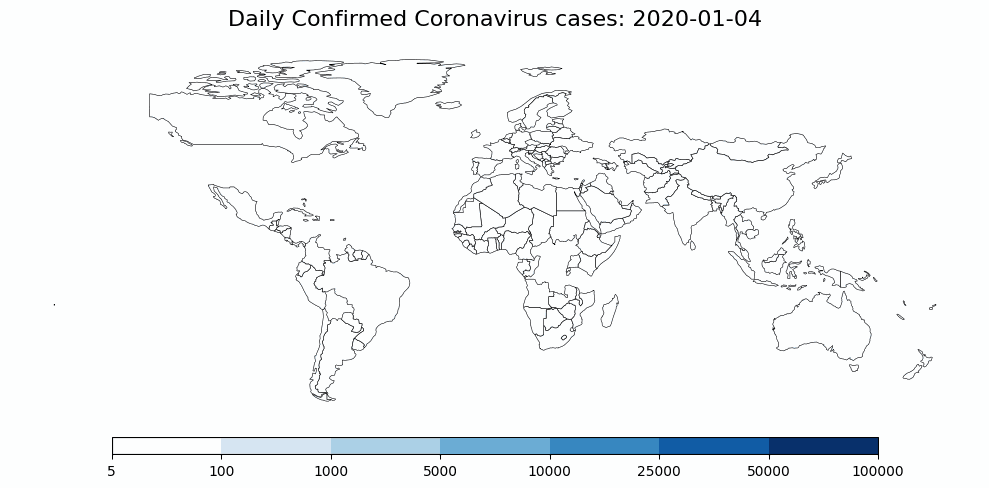

In [14]:
# Load and display the animated GIF
gif_path = "data/COVID-19_cases_map.gif"
display(Image(filename=gif_path))

<p style="text-align:center; font-size:16px; font-style:italic;">
Time-lapse maps show COVID-19’s rapid global transmission. <br>  
How different waves affected different regions.
</p>

#### Daily new confirmed COVID-19 deaths bar plot

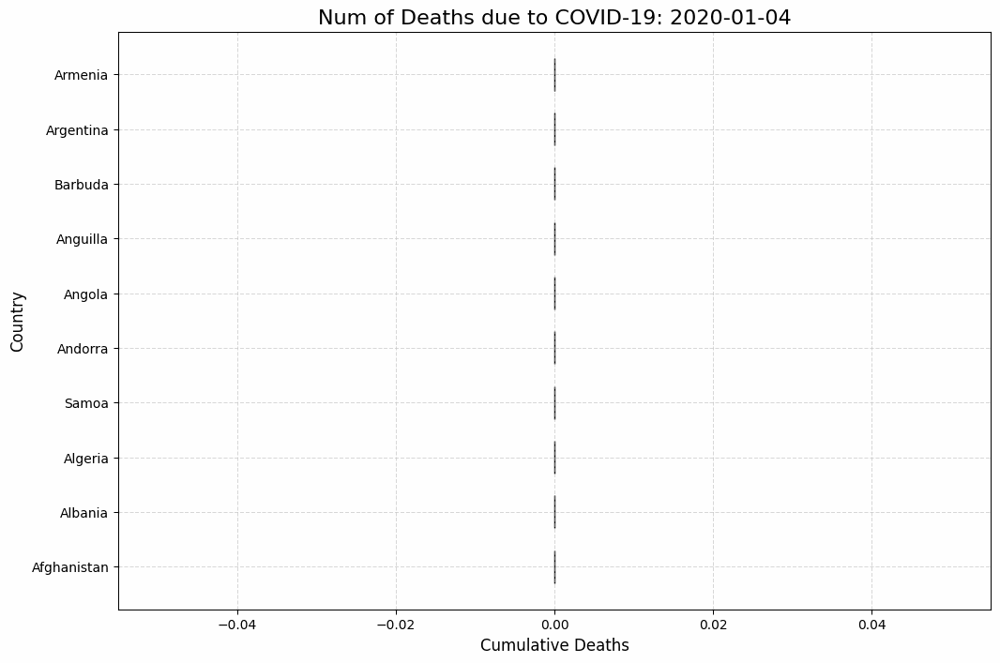

In [16]:
# Load and display the animated GIF
gif_path1 = "data/COVID-19_deaths_timeline.gif"
display(Image(filename=gif_path1))

<p style="text-align:center; font-size:16px; font-style:italic;">
Time-lapse bar plot of cumulative COVID-19 deaths over time
</p>


#### Global Daily COVID-19 cases & deaths

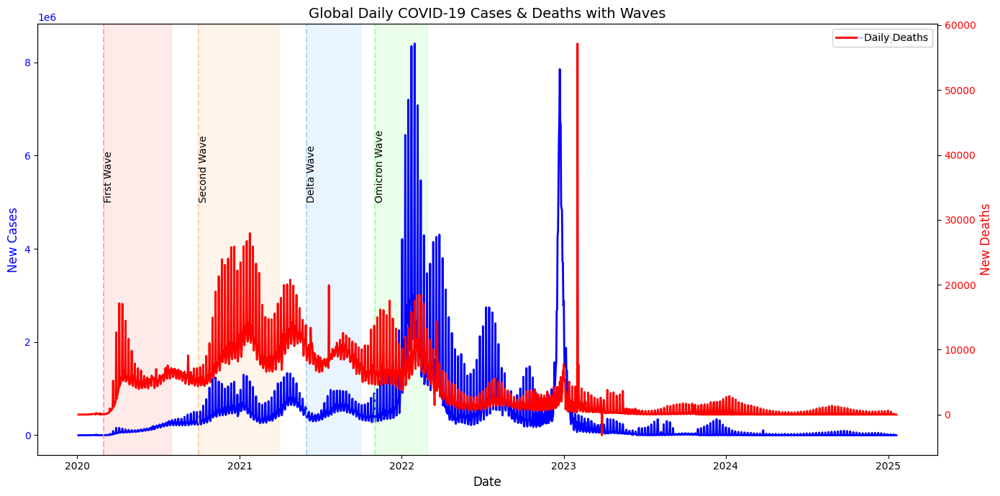

In [17]:
cases_deaths_plot(daily_cases, daily_deaths)

### COVID-19 Waves & their impact

#### • First Wave
- Initial rise in cases and deaths as the pandemic began.
- Gradual increase before the first major surge.

#### • Second Wave
- **One of the most severe waves** in terms of both cases & deaths.
- Higher peak than the first wave, indicating increased transmission.

#### • Omicron Wave
- **Record-high cases but relatively lower deaths** compared to previous waves.
- Suggests **higher transmissibility but lower fatality**, likely due to **Vaccination effects**

## How vaccinations influenced COVID-19 case numbers and fatalities.

In [18]:
vaccination_one_dose = pd.read_csv('data/vaccination_one_dose.csv', parse_dates = ['Day'])
vaccination_all_dose = pd.read_csv('data/vaccination_all_dose.csv', parse_dates = ['Day'])

In [19]:
vaccination_all_dose.columns = vaccination_all_dose.columns.str.lower()
vaccination_all_dose.rename(columns = {'people fully vaccinated (cumulative, per hundred)' : 'people_fully_vaccinated'}, inplace = True)
vaccination_all_dose_w = vaccination_all_dose[vaccination_all_dose['entity'] == 'World']

vaccination_one_dose.columns = vaccination_one_dose.columns.str.lower()
vaccination_one_dose.rename(columns = {'people vaccinated (cumulative, per hundred)' : 'people_one_dose_vaccinated'}, inplace = True)
vaccination_one_dose_w = vaccination_one_dose[vaccination_one_dose['entity'] == 'World']

In [20]:
vaccination_one_dose_w.columns

Index(['entity', 'day', 'people_one_dose_vaccinated'], dtype='object')

In [21]:
interactive_plot(daily_cases, daily_deaths, vaccination_all_dose_w, vaccination_one_dose_w)

### Impact of Vaccination on new cases and fatalities
- **Vaccination rates increased steadily**
- **As vaccination coverage grew, deaths per new case declined**, especially post-Omicron, deaths remained low after mass vaccination efforts.
- Lockdowns, travel restrictions, and vaccinations played a visible role in slowing or preventing surges. As immunity increased, deaths decoupled from case spikes.